In [1]:
CATEGORY = "wood"
DEFECT_TYPE = "combined"
MAX_DISPLAY = 40

In [3]:
from pathlib import Path
import pandas as pd

data_dir = Path("../data") if Path("../data").exists() else Path("data")
report_path = data_dir / "processed" / "split_70_15_15_augmented" / "augment_report.csv"
df = pd.read_csv(report_path)

print(f"Tổng số nhóm khuyết tật: {len(df)}")
print(f"Tổng ảnh defect train: {df['original_train'].sum()} -> {df['final_train'].sum()} (+{df['augmented_added'].sum()})")
print(f"Số lượng mỗi nhóm: Min = {df['final_train'].min()}, Max = {df['final_train'].max()}")
df[df["category"] == CATEGORY]

Tổng số nhóm khuyết tật: 73
Tổng ảnh defect train: 886 -> 2920 (+2034)
Số lượng mỗi nhóm: Min = 40, Max = 40


,group,category,original_train,augmented_added,final_train
61,wood_color,wood,6,34,40
62,wood_combined,wood,7,33,40
63,wood_hole,wood,7,33,40
64,wood_liquid,wood,7,33,40
65,wood_scratch,wood,15,25,40


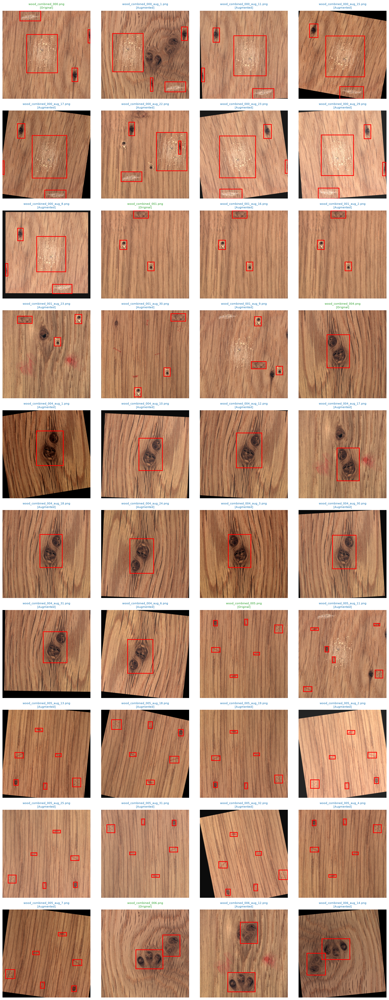

In [2]:
import os
import math
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

data_dir = Path("../data") if Path("../data").exists() else Path("data")
img_dir = data_dir / "processed" / "split_70_15_15_augmented" / "images" / "train"
lbl_dir = data_dir / "processed" / "split_70_15_15_augmented" / "labels" / "train"

prefix = f"{CATEGORY}_{DEFECT_TYPE}"
files = sorted([f for f in os.listdir(img_dir) if f.startswith(prefix) and f.endswith((".png", ".jpg"))])[:MAX_DISPLAY]

if not files:
    print(f"Không tìm thấy ảnh: {prefix}")
else:
    cols = min(4, len(files))
    rows = math.ceil(len(files) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(-1)

    for i, fname in enumerate(files):
        ax = axes[i]
        img = cv2.cvtColor(cv2.imread(str(img_dir / fname)), cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        ax.imshow(img)

        lbl_file = lbl_dir / f"{Path(fname).stem}.txt"
        if lbl_file.exists():
            with open(lbl_file, "r") as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        _, cx, cy, bw, bh = map(float, parts[:5])
                        x1 = (cx - bw / 2) * w
                        y1 = (cy - bh / 2) * h
                        rect = patches.Rectangle(
                            (x1, y1), bw * w, bh * h, linewidth=2, edgecolor="red", facecolor="none"
                        )
                        ax.add_patch(rect)

        tag = "Augmented" if "_aug_" in fname else "Original"
        color = "tab:blue" if "_aug_" in fname else "tab:green"
        ax.set_title(f"{fname}\n[{tag}]", fontsize=8, color=color)
        ax.axis("off")

    for j in range(len(files), len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()
